## Librerias

In [65]:
import pandas as pd
import urllib.request
from PIL import Image
import ML_ToolBox as tb
from sklearn.model_selection import train_test_split,  GridSearchCV
import bootcampviztools as vt
from sklearn.metrics import classification_report, make_scorer, precision_score, ConfusionMatrixDisplay,mean_absolute_percentage_error, mean_squared_error
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
import numpy as np
from sklearn.preprocessing import OrdinalEncoder
from catboost import CatBoostRegressor
import bootcampviztools as bt
import matplotlib.pyplot as plt
import seaborn as sns

## Data

In [2]:

df = pd.read_csv("data/train.csv", index_col = 0)
df.index.name = None

## Data exploration

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 912 entries, 755 to 229
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           912 non-null    object 
 1   Product           912 non-null    object 
 2   TypeName          912 non-null    object 
 3   Inches            912 non-null    float64
 4   ScreenResolution  912 non-null    object 
 5   Cpu               912 non-null    object 
 6   Ram               912 non-null    object 
 7   Memory            912 non-null    object 
 8   Gpu               912 non-null    object 
 9   OpSys             912 non-null    object 
 10  Weight            912 non-null    object 
 11  Price_in_euros    912 non-null    float64
dtypes: float64(2), object(10)
memory usage: 92.6+ KB


In [4]:
df.head()

,Company,Product,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price_in_euros
755,HP,250 G6,Notebook,15.6,Full HD 1920x1080,Intel Core i3 6006U 2GHz,8GB,256GB SSD,Intel HD Graphics 520,Windows 10,1.86kg,539.00
618,Dell,Inspiron 7559,Gaming,15.6,Full HD 1920x1080,Intel Core i7 6700HQ 2.6GHz,16GB,1TB HDD,Nvidia GeForce GTX 960<U+039C>,Windows 10,2.59kg,879.01
909,HP,ProBook 450,Notebook,15.6,Full HD 1920x1080,Intel Core i7 7500U 2.7GHz,8GB,1TB HDD,Nvidia GeForce 930MX,Windows 10,2.04kg,900.00
2,Apple,Macbook Air,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,898.94
286,Dell,Inspiron 3567,Notebook,15.6,Full HD 1920x1080,Intel Core i3 6006U 2.0GHz,4GB,1TB HDD,AMD Radeon R5 M430,Linux,2.25kg,428.00


## Data processing

El target es la columna `Price_in_euros`

In [5]:
tb.describe_df(df)

,Company,Product,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price_in_euros
Data_Type,object,object,object,float64,object,object,object,object,object,object,object,float64
Missings(%),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Unique_Values,19,480,6,17,36,107,9,37,93,9,165,603
Card(%),2.08,52.63,0.66,1.86,3.95,11.73,0.99,4.06,10.2,0.99,18.09,66.12


In [6]:
df["ram_GB"] = df["Ram"].str.replace("GB", "").astype(int)
df["weight_kg"] = df["Weight"].str.replace("kg", "").astype(float)



In [7]:
df.ram_GB.value_counts()

ram_GB
8     434
4     267
16    136
6      24
2      20
12     19
32     10
64      1
24      1
Name: count, dtype: int64

In [9]:
memory_split = df['Memory'].str.extract(r'(\d+)\s*([A-Za-z]+)\s*([A-Za-z]+)')
df['memory_type'] = memory_split[2]
df['capacity_gb'] = memory_split[0].astype(int)


In [59]:
df.memory_type.value_counts()

memory_type
SSD       587
HDD       256
Flash      63
Hybrid      6
Name: count, dtype: int64

In [60]:
df.capacity_gb.value_counts()

capacity_gb
256     349
1000    167
128     127
512      96
500      92
32       39
64       13
16        9
2000      8
0         6
180       3
240       1
508       1
8         1
Name: count, dtype: int64

In [10]:
df['capacity_gb'] = df.apply(lambda row: row['capacity_gb'] * 1000 if row['capacity_gb'] < 5 else row['capacity_gb'], axis=1)


In [61]:
df.capacity_gb.value_counts()

capacity_gb
256     349
1000    167
128     127
512      96
500      92
32       39
64       13
16        9
2000      8
0         6
180       3
240       1
508       1
8         1
Name: count, dtype: int64

In [11]:
cpu_split = df['Cpu'].str.extract(r'(Intel|AMD).*?(\d+(\.\d+)?GHz)')

df['cpu_brand'] = cpu_split[0]
df['cpu_speed'] = cpu_split[1].str.replace("GHz","").astype(float)


In [62]:
df.cpu_brand.value_counts()

cpu_brand
Intel    870
AMD       42
Name: count, dtype: int64

In [63]:
df.cpu_speed.value_counts()

cpu_speed
2.50    199
2.80    120
2.70    117
1.60    107
2.00     60
2.30     58
1.80     51
2.60     47
1.10     37
2.40     33
2.90     15
3.00     12
1.20     10
1.50      9
1.44      9
2.20      7
1.30      5
3.60      4
0.90      3
2.10      2
3.10      2
1.90      2
1.00      1
3.20      1
1.92      1
Name: count, dtype: int64

In [12]:
resolution_split = df['ScreenResolution'].str.extract(r'(?P<panel_type>.+?)\s*(?P<resolution>\d+x\d+)')
df['panel_type'] = resolution_split['panel_type']
df['resolution'] = resolution_split['resolution']
df.loc[df['panel_type'] == '1', 'panel_type'] = 'SD'

In [13]:
df.panel_type.value_counts()

panel_type
Full HD                                349
SD                                     231
IPS Panel Full HD                      167
IPS Panel Full HD / Touchscreen         32
Full HD / Touchscreen                   30
Touchscreen                             24
IPS Panel Retina Display                12
Quad HD+ / Touchscreen                  11
IPS Panel 4K Ultra HD / Touchscreen     10
IPS Panel Touchscreen                    8
4K Ultra HD / Touchscreen                7
IPS Panel                                7
IPS Panel Quad HD+ / Touchscreen         6
IPS Panel 4K Ultra HD                    5
IPS Panel Quad HD+                       4
4K Ultra HD                              3
Quad HD+                                 2
Touchscreen / Quad HD+                   1
2                                        1
Touchscreen / 4K Ultra HD                1
Touchscreen / Full HD                    1
Name: count, dtype: int64

In [14]:
fila_panel_type_2 = df.loc[df['panel_type'] == '2']
fila_panel_type_2.loc[fila_panel_type_2.index, 'resolution'] = '2560x1440'
fila_panel_type_2.loc[fila_panel_type_2.index, 'panel_type'] = 'Full HD'



In [15]:
df.drop(["ScreenResolution", "Cpu", "Memory", "Weight", "Ram"], axis= 1, inplace= True)

In [18]:
df

,Company,Product,TypeName,Inches,Gpu,OpSys,Price_in_euros,ram_GB,weight_kg,memory_type,capacity_gb,cpu_brand,cpu_speed,panel_type,resolution
755,HP,250 G6,Notebook,15.6,Intel HD Graphics 520,Windows 10,539.00,8,1.86,SSD,256,Intel,2.0,Full HD,1920x1080
618,Dell,Inspiron 7559,Gaming,15.6,Nvidia GeForce GTX 960<U+039C>,Windows 10,879.01,16,2.59,HDD,1000,Intel,2.6,Full HD,1920x1080
909,HP,ProBook 450,Notebook,15.6,Nvidia GeForce 930MX,Windows 10,900.00,8,2.04,HDD,1000,Intel,2.7,Full HD,1920x1080
2,Apple,Macbook Air,Ultrabook,13.3,Intel HD Graphics 6000,macOS,898.94,8,1.34,Flash,128,Intel,1.8,SD,440x900
286,Dell,Inspiron 3567,Notebook,15.6,AMD Radeon R5 M430,Linux,428.00,4,2.25,HDD,1000,Intel,2.0,Full HD,1920x1080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28,Dell,Inspiron 5570,Notebook,15.6,AMD Radeon 530,Windows 10,800.00,8,2.20,SSD,256,Intel,1.6,Full HD,1920x1080
1160,HP,Spectre Pro,2 in 1 Convertible,13.3,Intel HD Graphics 520,Windows 10,1629.00,8,1.48,SSD,256,Intel,2.4,Full HD / Touchscreen,1920x1080
78,Lenovo,IdeaPad 320-15IKBN,Notebook,15.6,Intel HD Graphics 620,No OS,519.00,8,2.20,HDD,2000,Intel,2.5,Full HD,1920x1080
23,HP,255 G6,Notebook,15.6,AMD Radeon R2,No OS,258.00,4,1.86,HDD,500,AMD,1.5,SD,366x768


-----------------------------------------------------------------------------------------------------------------

## Modelado

### 1. Definir X e y

In [19]:
X = df.drop(['Price_in_euros'], axis=1)
y = df['Price_in_euros'].copy()
X.shape

(912, 14)

In [20]:
y.shape

(912,)

### 2. Dividir X_train, X_test, y_train, y_test

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [22]:
X_train.Company.value_counts()

Company
Lenovo       162
Dell         158
HP           155
Asus         101
Acer          55
Toshiba       31
MSI           30
Apple         13
Razer          4
Mediacom       4
Xiaomi         3
Microsoft      3
Samsung        3
Google         2
Fujitsu        2
Vero           2
Chuwi          1
Name: count, dtype: int64

In [24]:
features_num = df.select_dtypes(include=['int', 'float']).columns.to_list()
features_num.remove("Price_in_euros")
features_cat = df.select_dtypes(include= ["object"]).columns.to_list()


In [25]:
features_cat

['Company',
 'Product',
 'TypeName',
 'Gpu',
 'OpSys',
 'memory_type',
 'cpu_brand',
 'panel_type',
 'resolution']

array([[<Axes: title={'center': 'Inches'}>,
        <Axes: title={'center': 'ram_GB'}>],
       [<Axes: title={'center': 'weight_kg'}>,
        <Axes: title={'center': 'capacity_gb'}>],
       [<Axes: title={'center': 'cpu_speed'}>, <Axes: >]], dtype=object)

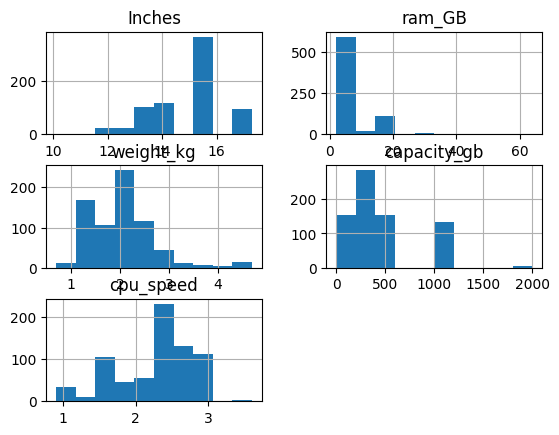

In [26]:
X_train[features_num].hist()

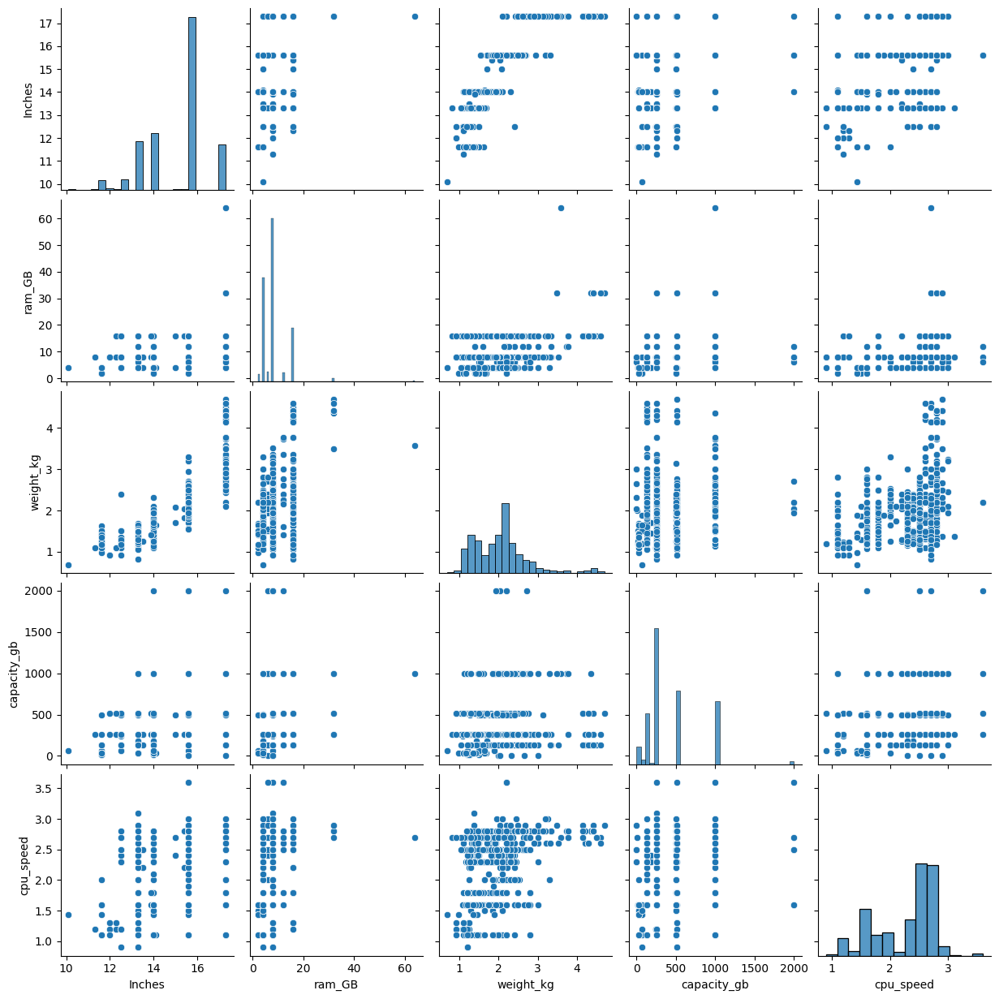

In [78]:
sns.pairplot(X_train)

In [27]:
X_train_scal = X_train.copy()
X_test_scal = X_test.copy()

In [28]:
X_train_scal = pd.get_dummies(X_train_scal, columns= features_cat, dtype= int)
X_test_scal = pd.get_dummies(X_test_scal, columns= features_cat, dtype= int)

In [29]:
scaler = StandardScaler()
X_train_scal[features_num] = scaler.fit_transform(X_train_scal[features_num])
X_test_scal[features_num] = scaler.transform(X_test_scal[features_num])

In [30]:
#Hay features diferentres en train y test por el One Hot encoding

In [31]:
columns_order = X_train_scal.columns
for column in columns_order:
    if column not in X_test_scal.columns:
        X_test[column] = 0
X_test_scal = X_test_scal.reindex(columns=columns_order)

C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\1257925788.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_test[column] = 0
C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\1257925788.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_test[column] = 0
C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\1257925788.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axi

In [32]:
X_test_scal.fillna(0, inplace= True)

In [33]:
X_train_scal.columns

Index(['Inches', 'ram_GB', 'weight_kg', 'capacity_gb', 'cpu_speed',
       'Company_Acer', 'Company_Apple', 'Company_Asus', 'Company_Chuwi',
       'Company_Dell',
       ...
       'resolution_2560x1440', 'resolution_2560x1600', 'resolution_2880x1800',
       'resolution_3200x1800', 'resolution_366x768', 'resolution_3840x2160',
       'resolution_440x900', 'resolution_560x1440', 'resolution_600x900',
       'resolution_920x1080'],
      dtype='object', length=572)

In [34]:
X_test_scal.columns

Index(['Inches', 'ram_GB', 'weight_kg', 'capacity_gb', 'cpu_speed',
       'Company_Acer', 'Company_Apple', 'Company_Asus', 'Company_Chuwi',
       'Company_Dell',
       ...
       'resolution_2560x1440', 'resolution_2560x1600', 'resolution_2880x1800',
       'resolution_3200x1800', 'resolution_366x768', 'resolution_3840x2160',
       'resolution_440x900', 'resolution_560x1440', 'resolution_600x900',
       'resolution_920x1080'],
      dtype='object', length=572)

### 3. Baseline de modelos


In [36]:
rf_reg = RandomForestRegressor(max_depth = 10, random_state= 42)
lin_reg = LinearRegression()
xgb_reg = XGBRegressor(max_depth = 10, random_state = 42)
cat_reg = CatBoostRegressor(iterations=150,
                          learning_rate=1,
                          depth=10)
modelos_reg = {
    "Random Forest": rf_reg,
    "Cat Boost": cat_reg,
    "Linear Regresion": lin_reg,
    #"XGBoost Regressor": xgb_reg
}

for tipo, modelo in modelos_reg.items():
    scores = cross_val_score(modelo, X_train_scal, y_train, cv=3, scoring='neg_mean_squared_error')
    rmse_scores = np.sqrt(-scores)
    print(f"{tipo}: {rmse_scores.mean()}")

Random Forest: 318.14127208329387
0:	learn: 389.9667720	total: 159ms	remaining: 23.6s
1:	learn: 359.7428129	total: 165ms	remaining: 12.2s
2:	learn: 315.5135433	total: 168ms	remaining: 8.22s
3:	learn: 300.7988216	total: 170ms	remaining: 6.19s
4:	learn: 260.4147951	total: 180ms	remaining: 5.22s
5:	learn: 238.6155583	total: 190ms	remaining: 4.55s
6:	learn: 230.2213970	total: 201ms	remaining: 4.1s
7:	learn: 208.8003236	total: 211ms	remaining: 3.74s
8:	learn: 200.8243130	total: 221ms	remaining: 3.46s
9:	learn: 181.6334747	total: 231ms	remaining: 3.23s
10:	learn: 155.7040564	total: 241ms	remaining: 3.05s
11:	learn: 151.5985187	total: 252ms	remaining: 2.9s
12:	learn: 138.3600419	total: 265ms	remaining: 2.79s
13:	learn: 134.7524568	total: 274ms	remaining: 2.66s
14:	learn: 119.7667669	total: 283ms	remaining: 2.55s
15:	learn: 116.6420523	total: 294ms	remaining: 2.46s
16:	learn: 110.4739805	total: 304ms	remaining: 2.38s
17:	learn: 108.6250905	total: 313ms	remaining: 2.3s
18:	learn: 103.4030006	to

In [37]:
#param_grid_rf = {
    #"n_estimators" : [10,25,50,60,100],
    #"max_depth" : [None,30, 40, 45, 50],
    #"min_samples_split": [1, 2, 3, 4],
    #"min_samples_leaf" : [1, 2, 3, 4],
    #"max_features" : ["log2", "sqrt", None]
#}

#best_model_rf = GridSearchCV(rf_reg, param_grid= param_grid_rf, cv = 5, scoring= "neg_mean_squared_error",n_jobs= -1)
#best_model_rf.fit(X_train_scal, y_train)

In [38]:
#Hacer un 3º con col_cat

In [39]:
param_grid_cat = {
    'depth': [4, 6, 5, 7, 8],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
    'iterations': [100, 200, 300, 400, 500]
}
best_model_cat = GridSearchCV(estimator=cat_reg, param_grid=param_grid_cat, cv=5, scoring='neg_mean_squared_error')
best_model_cat.fit(X_train_scal, y_train)

0:	learn: 674.3181929	total: 1.12ms	remaining: 111ms
1:	learn: 670.7958244	total: 2.15ms	remaining: 105ms
2:	learn: 667.5010505	total: 3.15ms	remaining: 102ms
3:	learn: 663.8865150	total: 4.18ms	remaining: 100ms
4:	learn: 660.0406427	total: 5.17ms	remaining: 98.2ms
5:	learn: 656.5970768	total: 6.17ms	remaining: 96.7ms
6:	learn: 653.5274014	total: 7.11ms	remaining: 94.4ms
7:	learn: 649.9552412	total: 8.42ms	remaining: 96.8ms
8:	learn: 646.5935864	total: 9.57ms	remaining: 96.8ms
9:	learn: 643.2040973	total: 10.6ms	remaining: 95.5ms
10:	learn: 639.7822725	total: 11.6ms	remaining: 93.8ms
11:	learn: 636.4921407	total: 12.6ms	remaining: 92.5ms
12:	learn: 633.4438056	total: 13.7ms	remaining: 91.6ms
13:	learn: 630.2108769	total: 14.8ms	remaining: 90.6ms
14:	learn: 626.8322957	total: 15.8ms	remaining: 89.5ms
15:	learn: 623.9336670	total: 16.8ms	remaining: 88.4ms
16:	learn: 620.8714630	total: 17.8ms	remaining: 87ms
17:	learn: 617.9109461	total: 19ms	remaining: 86.6ms
18:	learn: 614.7859445	total

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x0000023810B1E050>,
             param_grid={'depth': [4, 6, 5, 7, 8],
                         'iterations': [100, 200, 300, 400, 500],
                         'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5]},
             scoring='neg_mean_squared_error')

In [40]:
#print(best_model_rf.best_params_)
#print(np.sqrt(-best_model_rf.best_score_))
print(best_model_cat.best_params_)
print(np.sqrt(-best_model_cat.best_score_))

{'depth': 6, 'iterations': 500, 'learning_rate': 0.2}
259.57581119251483


In [41]:
best_model = best_model_cat

In [42]:
#metrica = RMSE
# Probar con todos,
# Cross validation
# quedarme con los mejores
# Grid Search
# optimización



In [43]:
y_pred = best_model.best_estimator_.predict(X_test_scal)
print("RMSE", np.sqrt(mean_squared_error(y_test, y_pred)))

RMSE 288.8156505708473


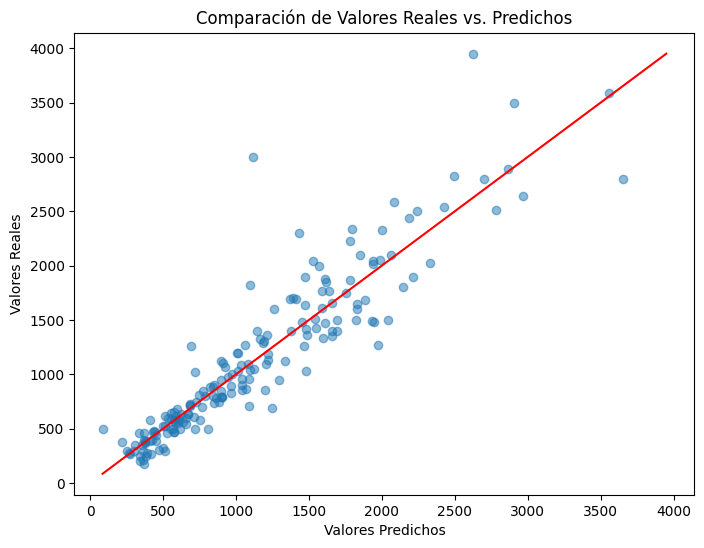

In [44]:
def plot_predictions_vs_actual(y_real, y_pred):
    """
    Función para graficar los valores reales vs. los valores predichos en una regresión.

    Args:
    y_real (array-like): Valores reales de la variable objetivo.
    y_pred (array-like): Valores predichos de la variable objetivo.
    """
    plt.figure(figsize=(8, 6))
    plt.scatter(y_pred, y_real, alpha=0.5)
    plt.xlabel("Valores Predichos")
    plt.ylabel("Valores Reales")

    # Línea y=x
    max_value = max(max(y_real), max(y_pred))
    min_value = min(min(y_real), min(y_pred))
    plt.plot([min_value, max_value], [min_value, max_value], 'r')

    plt.title("Comparación de Valores Reales vs. Predichos")
    plt.show()
plot_predictions_vs_actual(y_test, y_pred)

### 4. Sacar métricas, valorar los modelos 

Recuerda que en la competición se va a evaluar con la métrica de RMSE.

In [45]:
#from sklearn.metrics import mean_squared_error (mse)
y_predict = best_model.predict(X_test_scal)
mse = mean_squared_error(y_test, y_predict) 
RMSE = np.sqrt(mse)
print(RMSE)

288.8156505708473


-----------------------------------------------------------------

## Una vez listo el modelo, toca predecir ``test.csv``

**RECUERDA: APLICAR LAS TRANSFORMACIONES QUE HAYAS REALIZADO EN `train.csv` a `test.csv`.**


Véase:
- Estandarización/Normalización
- Eliminación de Outliers
- Eliminación de columnas
- Creación de columnas nuevas
- Gestión de valores nulos
- Y un largo etcétera de técnicas que como Data Scientist hayas considerado las mejores para tu dataset.

### 1. Carga los datos de `test.csv` para predecir.


In [46]:
X_pred = pd.read_csv("data/test.csv", index_col= 0)
X_pred.index.name = None 
X_pred.head()

# Hacer las mismas transformaciones que en el df de train

,Company,Product,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight
209,Lenovo,Legion Y520-15IKBN,Gaming,15.6,Full HD 1920x1080,Intel Core i7 7700HQ 2.8GHz,16GB,512GB SSD,Nvidia GeForce GTX 1060,No OS,2.4kg
1281,Acer,Aspire ES1-531,Notebook,15.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,4GB,500GB HDD,Intel HD Graphics 400,Linux,2.4kg
1168,Lenovo,V110-15ISK (i3-6006U/4GB/1TB/No,Notebook,15.6,1366x768,Intel Core i3 6006U 2.0GHz,4GB,1TB HDD,Intel HD Graphics 520,No OS,1.9kg
1231,Dell,Inspiron 7579,2 in 1 Convertible,15.6,IPS Panel Full HD / Touchscreen 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,Windows 10,2.191kg
1020,HP,ProBook 640,Notebook,14.0,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,4GB,256GB SSD,Intel HD Graphics 620,Windows 10,1.95kg


In [47]:
#Transformaciones:
X_pred["ram_GB"] = X_pred["Ram"].str.replace("GB", "").astype(int)
X_pred["weight_kg"] = X_pred["Weight"].str.replace("kg", "").astype(float)

memory_split = X_pred['Memory'].str.extract(r'(\d+)\s*([A-Za-z]+)\s*([A-Za-z]+)')
X_pred['memory_type'] = memory_split[2]
X_pred['capacity_gb'] = memory_split[0].astype(int)
X_pred['capacity_gb'] = X_pred.apply(lambda row: row['capacity_gb'] * 1000 if row['capacity_gb'] < 5 else row['capacity_gb'], axis=1)

cpu_split = X_pred['Cpu'].str.extract(r'(Intel|AMD).*?(\d+(\.\d+)?GHz)')
X_pred['cpu_brand'] = cpu_split[0]
X_pred['cpu_speed'] = cpu_split[1].str.replace("GHz","").astype(float)

resolution_split = X_pred['ScreenResolution'].str.extract(r'(?P<panel_type>.+?)\s*(?P<resolution>\d+x\d+)')
X_pred['panel_type'] = resolution_split['panel_type']
X_pred['resolution'] = resolution_split['resolution']
X_pred.loc[X_pred['panel_type'] == '1', 'panel_type'] = 'SD'
fila_panel_type_2 = X_pred.loc[X_pred['panel_type'] == '2']
fila_panel_type_2.loc[fila_panel_type_2.index, 'resolution'] = '2560x1440'
fila_panel_type_2.loc[fila_panel_type_2.index, 'panel_type'] = 'Full HD'

X_pred.drop(["ScreenResolution", "Cpu", "Memory", "Weight", "Ram"], axis= 1, inplace= True)

features_num = X_pred.select_dtypes(include=['int', 'float']).columns.to_list()

features_cat = X_pred.select_dtypes(include= ["object"]).columns.to_list()

X_pred = pd.get_dummies(X_pred, columns= features_cat, dtype= int)

scaler = StandardScaler()

X_pred[features_num] = scaler.fit_transform(X_pred[features_num])

columns_order = X_train_scal.columns
for column in columns_order:
    if column not in X_pred.columns:
        X_pred[column] = 0
        
X_pred = X_pred.reindex(columns=columns_order)
X_test_scal.fillna(0, inplace= True)


X_pred.head()

C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\251287955.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_pred[column] = 0
C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\251287955.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_pred[column] = 0
C:\Users\lucas\AppData\Local\Temp\ipykernel_22848\251287955.py:37: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axi

,Inches,ram_GB,weight_kg,capacity_gb,cpu_speed,Company_Acer,Company_Apple,Company_Asus,Company_Chuwi,Company_Dell,...,resolution_2560x1440,resolution_2560x1600,resolution_2880x1800,resolution_3200x1800,resolution_366x768,resolution_3840x2160,resolution_440x900,resolution_560x1440,resolution_600x900,resolution_920x1080
209,0.357415,1.420931,0.502123,0.140767,0.978917,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1281,0.357415,-0.902069,0.502123,0.108915,-1.512561,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1168,0.357415,-0.902069,-0.250117,1.436076,-0.682069,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1231,0.357415,-0.127735,0.187687,-0.538739,0.356047,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1020,-0.786899,-0.902069,-0.174893,-0.538739,0.356047,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
X_pred.shape

(391, 572)

In [49]:
predictions_submit = best_model.predict(X_pred)
predictions_submit

array([1481.96033539,  287.76389395,  315.86769216,  921.92784853,
        881.92380498,  336.58386033,  878.31602469,  981.67131478,
       1505.43111611,  231.13380877, 2294.80525823, 1392.2477084 ,
        482.90452768, 1631.52232313,  949.8581734 ,  718.25012244,
       2240.2160463 , 1541.86581914, 1984.75733733,  619.64052419,
       1357.69926842,  435.4763817 ,  758.2753704 , 1080.6156271 ,
        526.25602399,  679.59145948,  553.14173718,  679.8417793 ,
       2565.63547753, 1063.37079603, 2639.59320907,  371.42633527,
        802.9872006 , 3174.85730825, 1969.80180459, 1710.27693522,
        574.08641905, 1093.00970412,  875.9318733 , 1772.81427791,
        854.25877426,  852.59572695,  595.81848173, 1270.19870384,
       1076.50914745, 1074.65949222, 1073.1125188 ,  677.87908934,
        774.2329968 ,  342.41770888, 1614.83543257,  617.55581299,
       1138.7058199 ,  194.86496558, 2051.65654345, 1769.9019444 ,
        803.91925115,  810.19142938,  928.30356487,  659.72716

In [54]:
submission = pd.DataFrame({"laptop_ID": X_pred.index, "Price_in_euros": predictions_submit})

In [55]:
submission.head()

,laptop_ID,Price_in_euros
0,209,1481.960335
1,1281,287.763894
2,1168,315.867692
3,1231,921.927849
4,1020,881.923805


In [56]:
submission.shape

(391, 2)